# Audio Preprocessing example
[Medium reference](https://towardsdatascience.com/music-genre-classification-with-python-c714d032f0d8)
## Load Audio

In [1]:
import librosa
audio_path = 'genre12/blues/blues.00000.wav'
x, sr  = librosa.load(audio_path)
print(type(x), type(sr))
print(x.shape, sr)

<class 'numpy.ndarray'> <class 'int'>
(661794,) 22050


In [42]:
# Resample at 44.1 KHz
x_1, sr_1 = librosa.load(audio_path, sr = 44100)

In [43]:
print(x_1.shape)
print(sr_1)

(1323588,)
44100


## Playing Audio 
Using `IPython.display.Audio`

In [3]:
import IPython.display as ipd 
ipd.Audio(audio_path)

## Visualizing Audio
Plot audio array using `librosa.display.waveplot`
### Waveform

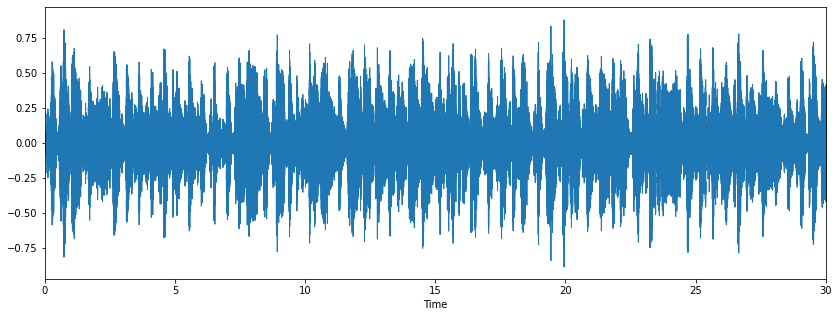

In [4]:
%matplotlib inline
import matplotlib.pyplot as plt 
import librosa.display
plt.figure(figsize=(14,5))
librosa.display.waveplot(x, sr=sr)

### Spectrogram
[WikiLink](https://en.wikipedia.org/wiki/Spectrogram)  
Here we use short-time fourier transform to create Spectrograms

In [5]:
help(librosa.stft)

Help on function stft in module librosa.core.spectrum:

stft(y, n_fft=2048, hop_length=None, win_length=None, window='hann', center=True, dtype=<class 'numpy.complex64'>, pad_mode='reflect')
    Short-time Fourier transform (STFT). [1]_ (chapter 2)
    
    The STFT represents a signal in the time-frequency domain by
    computing discrete Fourier transforms (DFT) over short overlapping
    windows.
    
    This function returns a complex-valued matrix D such that
    
    - `np.abs(D[f, t])` is the magnitude of frequency bin `f`
      at frame `t`, and
    
    - `np.angle(D[f, t])` is the phase of frequency bin `f`
      at frame `t`.
    
    The integers `t` and `f` can be converted to physical units by means
    of the utility functions `frames_to_sample` and `fft_frequencies`.
    
    .. [1] M. Müller. "Fundamentals of Music Processing." Springer, 2015
    
    
    Parameters
    ----------
    y : np.ndarray [shape=(n,)], real-valued
        input signal
    
    n_fft : int 

In [6]:
x = librosa.stft(x)
print(x)
print(x.shape)

[[-5.28017139e+00+0.0000000e+00j -3.70380926e+00+0.0000000e+00j
  -2.53658724e+00+0.0000000e+00j ...  3.10940504e+00+0.0000000e+00j
  -4.33118105e-01+0.0000000e+00j -1.74286175e+01+0.0000000e+00j]
 [ 4.27672338e+00+1.0408341e-16j  8.50443125e-01+1.6163833e+00j
   1.28570247e+00-2.8567898e-01j ... -2.20653963e+00+2.1858121e-01j
  -3.14449644e+00-3.2049682e+00j  1.12701941e+01-1.3743819e+01j]
 [-3.94051814e+00-1.4770683e-17j  1.57026231e+00+4.1647038e-01j
  -1.75258324e-01+7.0544934e-01j ... -5.07911384e-01-1.4191605e+00j
  -6.45651579e-01-1.5557450e+00j  2.28059745e+00+1.6550421e+01j]
 ...
 [-8.06762557e-03+4.3623413e-18j  3.98801966e-03-1.9650784e-04j
  -1.77181300e-05+2.0720602e-04j ...  2.41400747e-04-1.1797844e-04j
  -6.74371433e-04+1.6490875e-03j  2.47839396e-03-1.0946114e-02j]
 [ 7.85761513e-03-1.0928758e-16j -9.43385112e-06-3.9045541e-03j
  -6.33000236e-05-1.4332175e-04j ...  1.18047705e-04+1.4816991e-04j
  -7.90521502e-04+8.0170174e-04j  6.89925812e-03+8.4079411e-03j]
 [-7.83765

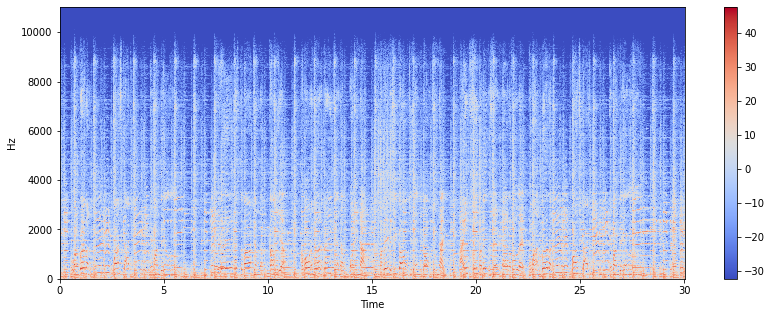

In [7]:
Xdb = librosa.amplitude_to_db(abs(x))
plt.figure(figsize=(14,5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

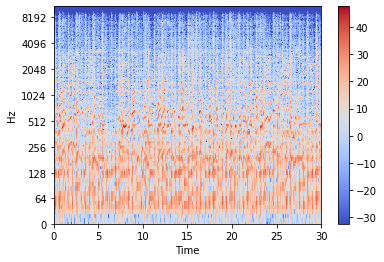

In [8]:
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

## Feature extraction
### Zero crossing rate

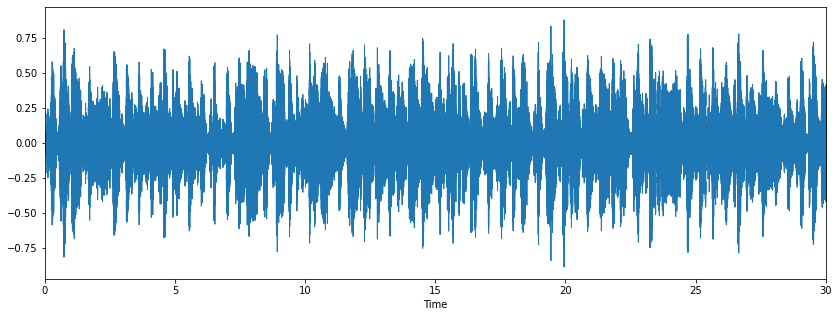

In [9]:
# Load the signal
x, sr = librosa.load(audio_path)
# plot signal
plt.figure(figsize=(14,5))
librosa.display.waveplot(x, sr=sr)

In [40]:
sr

22050

In [45]:
x.shape

(661794,)

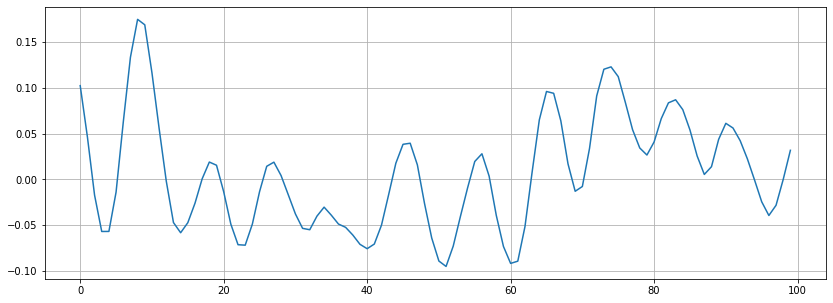

In [10]:
# Zooming in
n0 = 9000
n1 = 9100
plt.figure(figsize=(14,5))
plt.plot(x[n0:n1])
plt.grid()

In [15]:
zero_crossings = librosa.zero_crossings(x[n0:n1], pad=False)
print(zero_crossings)
print(sum(zero_crossings))

[False False  True False False False  True False False False False False
  True False False False False  True False False  True False False False
 False False  True False False  True False False False False False False
 False False False False False False False False  True False False False
  True False False False False False False  True False False  True False
 False False False  True False False False False False  True False  True
 False False False False False False False False False False False False
 False False False False False False False False False False  True False
 False False False  True]
16


In [41]:
help(librosa.load)

Help on function load in module librosa.core.audio:

load(path, sr=22050, mono=True, offset=0.0, duration=None, dtype=<class 'numpy.float32'>, res_type='kaiser_best')
    Load an audio file as a floating point time series.
    
    Audio will be automatically resampled to the given rate
    (default `sr=22050`).
    
    To preserve the native sampling rate of the file, use `sr=None`.
    
    Parameters
    ----------
    path : string, int, pathlib.Path or file-like object
        path to the input file.
    
        Any codec supported by `soundfile` or `audioread` will work.
    
        Any string file paths, or any object implementing Python's
        file interface (e.g. `pathlib.Path`) are supported as `path`.
    
        If the codec is supported by `soundfile`, then `path` can also be
        an open file descriptor (int).
    
    sr   : number > 0 [scalar]
        target sampling rate
    
        'None' uses the native sampling rate
    
    mono : bool
        convert si

### Spectral Centroid

In [23]:
spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]

In [26]:
print(spectral_centroids)
print(spectral_centroids.shape)

[2175.02383311 2103.86995762 1955.28566681 ... 1490.45684641 1506.97560844
 1442.64520571]
(1293,)


In [27]:
from sklearn.preprocessing import minmax_scale

In [30]:
minmax_scale(spectral_centroids)

array([0.38210239, 0.35841826, 0.30896081, ..., 0.15423888, 0.15973728,
       0.1383244 ])

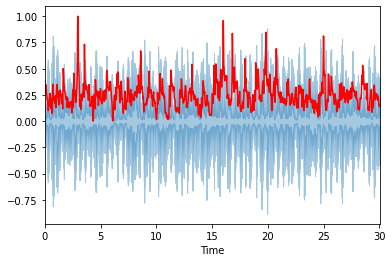

In [29]:
# Computing the time variable for visualization
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)
# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return minmax_scale(x, axis=axis)
#Plotting the Spectral Centroid along the waveform
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='r')


In [39]:
frames

range(0, 1293)

In [44]:
t

array([0.00000000e+00, 2.32199546e-02, 4.64399093e-02, ...,
       2.99537415e+01, 2.99769615e+01, 3.00001814e+01])

### Spectral Rolloff

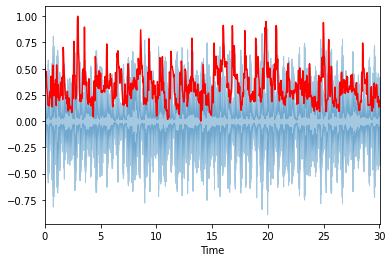

In [31]:
spectral_rolloff = librosa.feature.spectral_rolloff(x+0.01, sr=sr)[0]
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_rolloff), color='r')

### Mel-Frequency Cepstral Coefficients

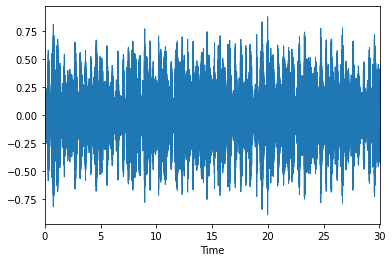

In [32]:
librosa.display.waveplot(x, sr=sr)

In [36]:
mfccs = librosa.feature.mfcc(x, sr = sr)
print(mfccs.shape)
print(mfccs)

(20, 1293)
[[-211.48465    -208.94481    -193.90889    ... -109.999146
   -86.84641     -79.03764   ]
 [  99.022964    101.24678     102.24396    ...  150.07935
   138.89685     140.24707   ]
 [ -10.634697     -9.346699      1.9154352  ...  -50.795135
   -36.61398     -31.443943  ]
 ...
 [   8.944412      6.882746      3.6500256  ...   -2.8571541
    -6.2547855    -0.48850513]
 [   3.074852      4.566725      4.788998   ...   -7.574688
    -8.4400625    -7.8806586 ]
 [   5.041527      2.8966336     0.9402466  ...   -7.555337
     0.29069707    2.6588178 ]]


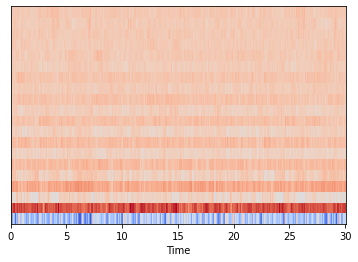

In [34]:
# Displaying the MFCCs
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

[-1.4751343e-08 -1.1801074e-08 -1.1801074e-08 -1.4751343e-08
  5.9005369e-09  3.6878358e-09 -5.9005369e-09  1.1801074e-08
  8.8508054e-09 -1.4751342e-09  5.9005369e-09  0.0000000e+00
 -2.9502685e-09 -3.6878358e-09 -5.9005369e-09  0.0000000e+00
 -5.9005369e-09  4.4254027e-09  5.9005369e-09 -2.9502685e-09]
[0.9999999 0.9999999 1.        1.        1.        1.        1.
 1.        1.        0.9999999 1.0000001 1.        1.        1.
 1.        1.        1.0000001 1.        1.        1.       ]


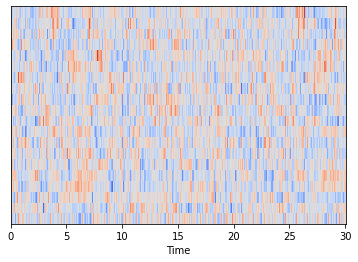

In [37]:
# Feature Scaling
from sklearn.preprocessing import scale
mfccs = scale(mfccs, axis=1)
print(mfccs.mean(axis=1))
print(mfccs.var(axis=1))
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

### Chroma Frequencies

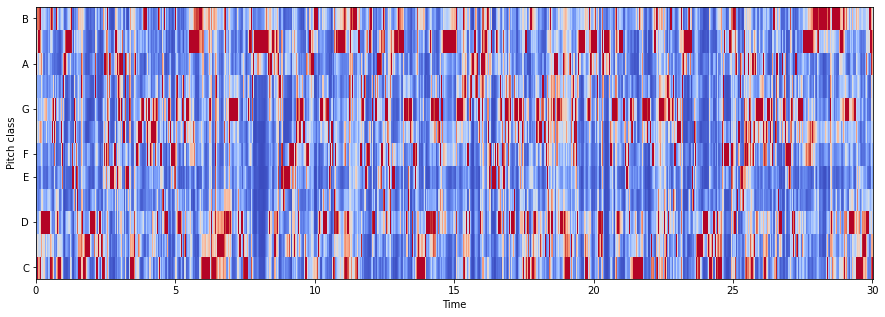

In [46]:
hop_length = 512 
chromagram = librosa.feature.chroma_stft(x, sr=sr, hop_length=hop_length)
plt.figure(figsize=(15,5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')